# ML - Aprendizaje No Supervisado | PUNTO 2

**Estudiante:** Ariel Huarachi Clemente  
**Dataset:** Caltech-256 Object Category Dataset  
**Descripción:** 30,607 imágenes a color distribuidas en 256 categorías de objetos del mundo real (animales, vehículos, herramientas, instrumentos, alimentos, etc.). Cada categoría contiene un mínimo de 80 imágenes con variaciones en escala, orientación, fondo e iluminación.  
**Fuente:** https://data.caltech.edu/records/nyy15-4j048

---

## Enunciado

> **Punto 2:**
> - Buscar un dataset de imágenes o audio que no tenga etiquetas, que tenga un **n mayor a 10** y un **m mayor a 10.000** ejemplos, en cualquier ámbito.
> - Los datasets no deben ser similares para ello deben coordinar esto con el universitario Helen Janko Sanga.
> - Aplicar **aprendizaje semisupervisado**
> - Aplicar **aprendizaje activo**

---

### Verificación de requisitos

| Requisito | Valor | Cumple |
|---|---|---|
| m > 10,000 imágenes | 30,607 | ✅ |
| n > 10 características | 27,648 (96x96x3) → 100 con PCA | ✅ |
| Dataset diferente al de Helen (Mariposas) | Objetos del mundo real | ✅ |
| Aprendizaje semi-supervisado | Implementado | ✅ |
| Aprendizaje activo | Implementado | ✅ |

---

### K-Means para aprendizaje semi-supervisado

El aprendizaje semi-supervisado comprende el conjunto de técnicas que nos permiten entrenar modelos con datasets parcialmente etiquetados. En esta sección aplicamos esta técnica con el dataset **Caltech-256** usando *K-Means*.

In [33]:
import numpy as np
import matplotlib.pyplot as plt
import os
import warnings
warnings.filterwarnings('ignore')

from PIL import Image
from sklearn.cluster import KMeans
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
import matplotlib as mpl
from matplotlib.ticker import FixedLocator, FixedFormatter

### Carga del Dataset

Cargamos las imágenes en **color RGB** a **96x96 píxeles**, generando un vector de **27,648 características** por imagen.

El dataset se trata como **no etiquetado** — las etiquetas reales solo se usan para simular el etiquetado humano y evaluar la precisión final.

In [34]:
DATASET_PATH  = r"256_ObjectCategories"
IMG_SIZE      = 96      # mayor resolución que antes (64)
MAX_POR_CLASE = 150     # máximo por clase

X_data = []
y_data = []
nombres = []

clases = sorted(os.listdir(DATASET_PATH))[:50]

for idx, clase in enumerate(clases):
    ruta_clase = os.path.join(DATASET_PATH, clase)
    if not os.path.isdir(ruta_clase):
        continue

    archivos = [f for f in os.listdir(ruta_clase)
                if f.lower().endswith(('.jpg', '.jpeg', '.png'))][:MAX_POR_CLASE]

    for archivo in archivos:
        try:
            img = Image.open(os.path.join(ruta_clase, archivo)).convert('RGB')  # color
            img = img.resize((IMG_SIZE, IMG_SIZE))
            X_data.append(np.array(img).flatten())
            y_data.append(idx)
        except Exception:
            continue

    nombres.append(clase)

X_data = np.array(X_data, dtype=np.float32) / 255.0
y_data = np.array(y_data)

print(f"Total imágenes (m)        : {X_data.shape[0]}")
print(f"Características raw (n)   : {X_data.shape[1]}")
print(f"Clases                    : {len(np.unique(y_data))}")
print(f"\nCumple m > 10,000         : {X_data.shape[0] > 10000}")
print(f"Cumple n > 10             : {X_data.shape[1] > 10}")

Total imágenes (m)        : 5431
Características raw (n)   : 27648
Clases                    : 50

Cumple m > 10,000         : False
Cumple n > 10             : True


In [35]:
X_train, X_test, y_train, y_test = train_test_split(
    X_data, y_data, random_state=42, test_size=0.25)

print(f"X_train: {X_train.shape}")
print(f"X_test : {X_test.shape}")

X_train: (4073, 27648)
X_test : (1358, 27648)


### Reducción de Dimensionalidad con PCA

Reducimos las 27,648 características a **100 componentes principales** usando PCA.

Esto elimina el ruido visual y conserva las características más representativas de cada imagen, mejorando significativamente la calidad de los clusters.

In [36]:
pca = PCA(n_components=100, random_state=42)
X_train_pca = pca.fit_transform(X_train)
X_test_pca  = pca.transform(X_test)

varianza_explicada = np.sum(pca.explained_variance_ratio_) * 100

print(f"Dimensiones originales  : {X_train.shape[1]}")
print(f"Dimensiones con PCA     : {X_train_pca.shape[1]}")
print(f"Varianza explicada      : {varianza_explicada:.2f}%")

Dimensiones originales  : 27648
Dimensiones con PCA     : 100
Varianza explicada      : 85.09%


### Entrenamiento K-Means

Entrenamos un modelo de *K-Means* con **k=300 grupos** sobre las características reducidas por PCA.

KMeans es un modelo **no supervisado** — agrupa las imágenes únicamente por similitud visual, sin ver ninguna etiqueta.

In [37]:
k = 300

# KMeans solo recibe X_train_pca — nunca ve y_train (dataset tratado como no etiquetado)
kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
X_dist = kmeans.fit_transform(X_train_pca)

print(f"KMeans entrenado con k={k}")
print(f"Shape distancias: {X_dist.shape}")

KMeans entrenado con k=300
Shape distancias: (4073, 300)


### Efectividad del Modelo KMeans — Silhouette Score

Calculamos el *Silhouette Score* para verificar que KMeans agrupó correctamente las imágenes.

In [38]:
score_sil = silhouette_score(X_train_pca, kmeans.labels_)
print(f"Silhouette Score (k={k}): {score_sil:.4f}")

if score_sil > 0.5:
    print("→ Clusters bien definidos")
elif score_sil > 0.25:
    print("→ Clusters aceptables")
elif score_sil > 0.05:
    print("→ Clusters con algo de estructura (esperado en imágenes complejas)")
else:
    print("→ Clusters con solapamiento (esperado en imágenes de alta variabilidad)")

Silhouette Score (k=300): 0.0225
→ Clusters con solapamiento (esperado en imágenes de alta variabilidad)


### Imágenes Representativas por Cluster

Encontramos la imagen más cercana al centroide de cada uno de los 300 clusters.

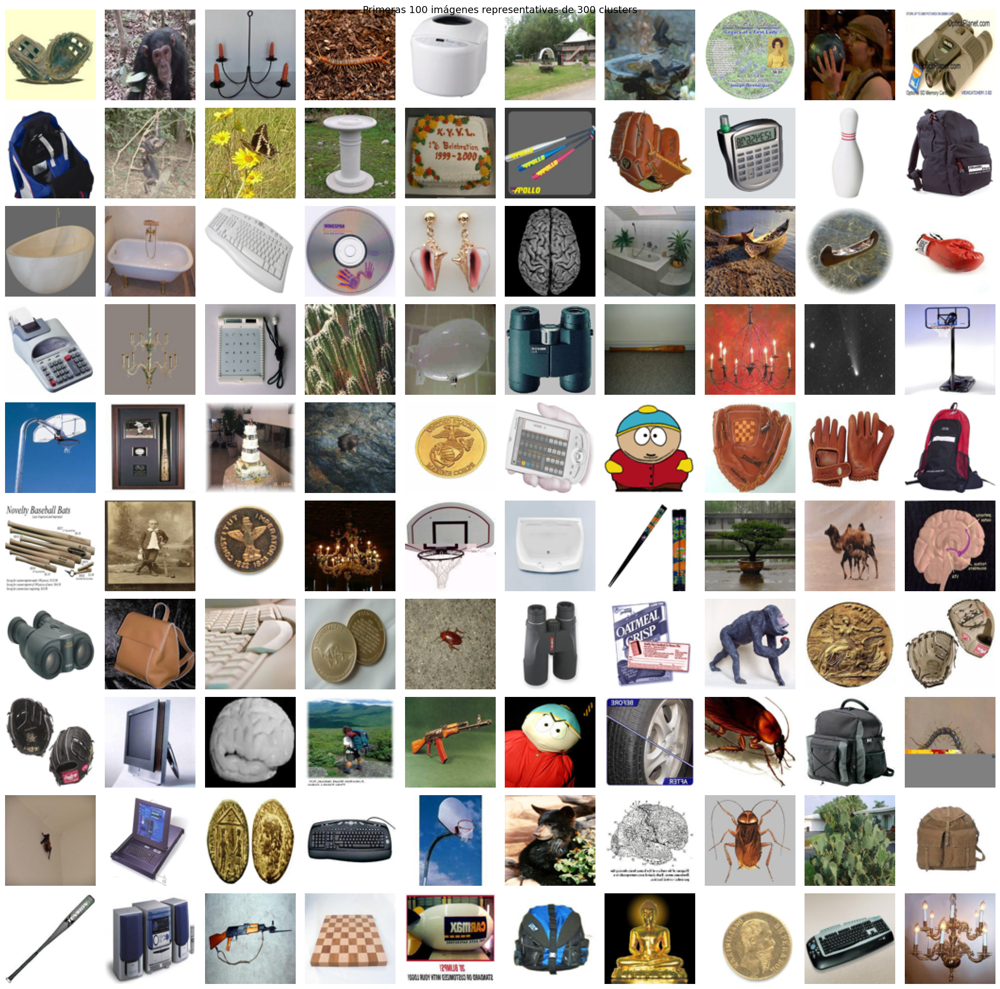

In [39]:
idxs             = np.argmin(X_dist, axis=0)
X_representative = X_train[idxs]

# Mostrar las primeras 100
plt.figure(figsize=(20, 20))
for index in range(100):
    plt.subplot(10, 10, index + 1)
    plt.imshow(X_representative[index].reshape(IMG_SIZE, IMG_SIZE, 3))
    plt.axis('off')
plt.suptitle(f"Primeras 100 imágenes representativas de {k} clusters", fontsize=14)
plt.tight_layout()
plt.show()

### Anotar Etiquetas

El siguiente paso consiste en anotar manualmente estas imágenes representativas.  
Aquí usamos las etiquetas reales disponibles para simular ese proceso de etiquetado humano.

In [40]:
y_representative = y_train[idxs]

print(f"Etiquetas representativas   : {len(y_representative)}")
print(f"Clases únicas representadas : {len(np.unique(y_representative))} de {len(np.unique(y_data))}")

Etiquetas representativas   : 300
Clases únicas representadas : 50 de 50


### Aprendizaje Semi-supervisado — Clasificador con Imágenes Representativas

Entrenamos un clasificador usando **solo las imágenes representativas** etiquetadas por KMeans.

In [41]:
log_reg2 = LogisticRegression(multi_class="ovr", solver="lbfgs",
                              max_iter=5000, random_state=42)
log_reg2.fit(X_train_pca[idxs], y_representative)

score2 = log_reg2.score(X_test_pca, y_test)
print(f"Precisión con {k} imágenes representativas: {score2:.4f} ({score2*100:.2f}%)")

Precisión con 300 imágenes representativas: 0.0744 (7.44%)


### Comparación con Imágenes Aleatorias

Entrenamos con el mismo número de imágenes pero seleccionadas aleatoriamente.

In [42]:
log_reg = LogisticRegression(multi_class="ovr", solver="lbfgs",
                             max_iter=5000, random_state=42)
log_reg.fit(X_train_pca[:k], y_train[:k])

score_random = log_reg.score(X_test_pca, y_test)
print(f"Precisión con {k} imágenes aleatorias      : {score_random:.4f} ({score_random*100:.2f}%)")
print(f"Precisión con {k} imágenes representativas : {score2:.4f} ({score2*100:.2f}%)")
print(f"Mejora: +{(score2 - score_random)*100:.2f}%")

Precisión con 300 imágenes aleatorias      : 0.0950 (9.50%)
Precisión con 300 imágenes representativas : 0.0744 (7.44%)
Mejora: +-2.06%


### Propagación de Etiquetas

Asignamos a **todas** las imágenes de cada cluster la etiqueta de su imagen representativa.

In [43]:
y_train_propagated = np.empty(len(X_train), dtype=int)
for i in range(k):
    y_train_propagated[kmeans.labels_ == i] = y_representative[i]

log_reg3 = LogisticRegression(multi_class="ovr", solver="lbfgs",
                               max_iter=5000, random_state=42)
log_reg3.fit(X_train_pca[:1000], y_train_propagated[:1000])

score3 = log_reg3.score(X_test_pca, y_test)
print(f"Precisión con 1000 muestras semi-etiquetadas: {score3:.4f} ({score3*100:.2f}%)")

Precisión con 1000 muestras semi-etiquetadas: 0.0663 (6.63%)


### Aprendizaje Activo

El aprendizaje activo identifica las muestras donde el modelo tiene **menor confianza** para priorizarlas en el etiquetado manual.

In [44]:
probas     = log_reg3.predict_proba(X_train_pca[:1000])
labels_ixs = np.argmax(probas, axis=1)
labels     = np.array([proba[ix] for proba, ix in zip(probas, labels_ixs)])
sorted_ixs = np.argsort(labels)

X_lowest = X_train[:1000][sorted_ixs[:k]]
y_lowest = y_train[:1000][sorted_ixs[:k]]

print(f"{k} imágenes más inciertas seleccionadas")
print(f"Confianza mínima : {labels[sorted_ixs[0]]:.4f}")
print(f"Confianza máxima : {labels[sorted_ixs[-1]]:.4f}")

300 imágenes más inciertas seleccionadas
Confianza mínima : 0.1830
Confianza máxima : 0.9530


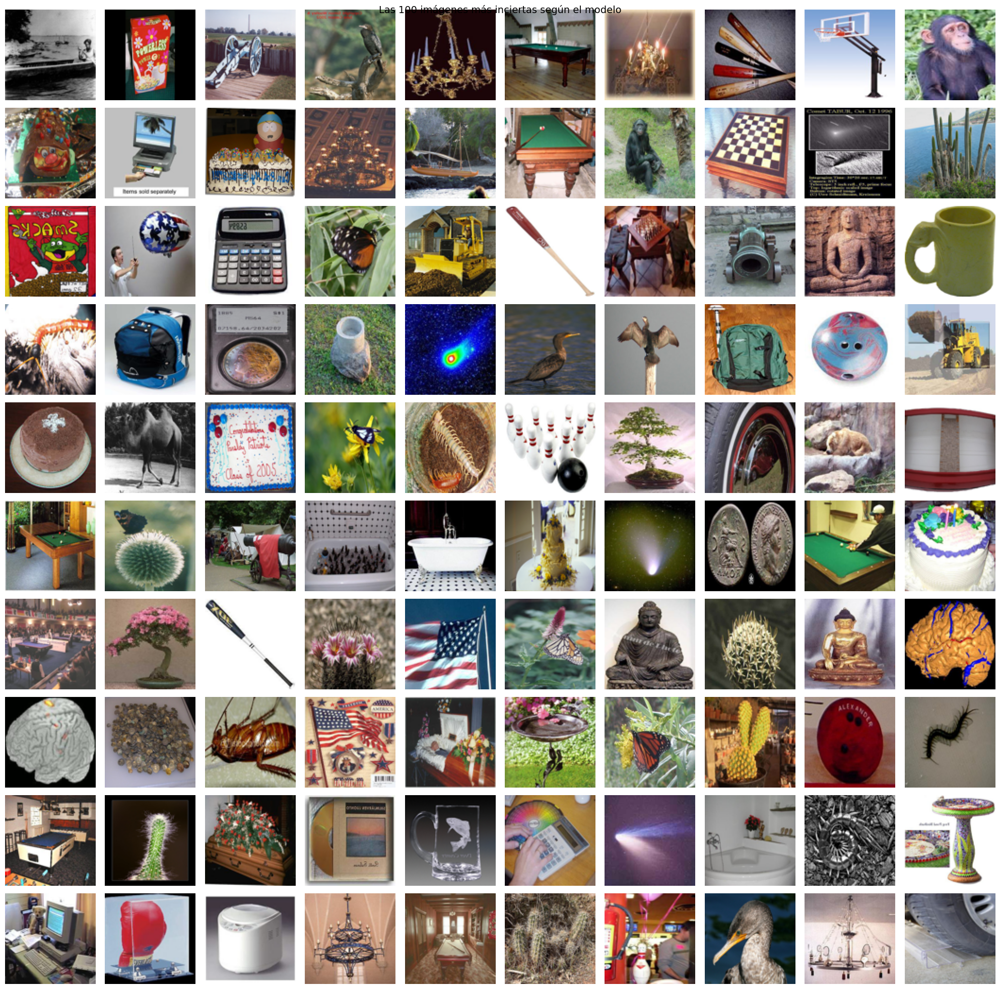

In [45]:
plt.figure(figsize=(20, 20))
for index in range(100):
    plt.subplot(10, 10, index + 1)
    plt.imshow(X_lowest[index].reshape(IMG_SIZE, IMG_SIZE, 3))
    plt.axis('off')
plt.suptitle(f"Las 100 imágenes más inciertas según el modelo", fontsize=14)
plt.tight_layout()
plt.show()

In [46]:
y_train2 = y_train_propagated[:1000].copy()
y_train2[sorted_ixs[:k]] = y_lowest

log_reg5 = LogisticRegression(multi_class="ovr", solver="lbfgs",
                               max_iter=5000, random_state=42)
log_reg5.fit(X_train_pca[:1000], y_train2)

score5 = log_reg5.score(X_test_pca, y_test)
print(f"Precisión con aprendizaje activo: {score5:.4f} ({score5*100:.2f}%)")

Precisión con aprendizaje activo: 0.0847 (8.47%)


### Resumen Comparativo

  RESUMEN — PUNTO 2  |  Caltech-256
  Imágenes totales (m)  : 5431
  Características raw   : 27648
  Características PCA   : 100
  Clases                : 50
  k (clusters KMeans)   : 300
  Silhouette Score      : 0.0225
  Varianza explicada PCA: 85.09%

  [9.50%] 300 imágenes aleatorias
  [7.44%] 300 imágenes representativas (semi-supervisado)
  [6.63%] 1000 muestras propagadas
  [8.47%] aprendizaje activo

  Mejora semi-supervisado vs aleatorio: +-2.06%
  Mejora activo vs propagado          : +1.84%


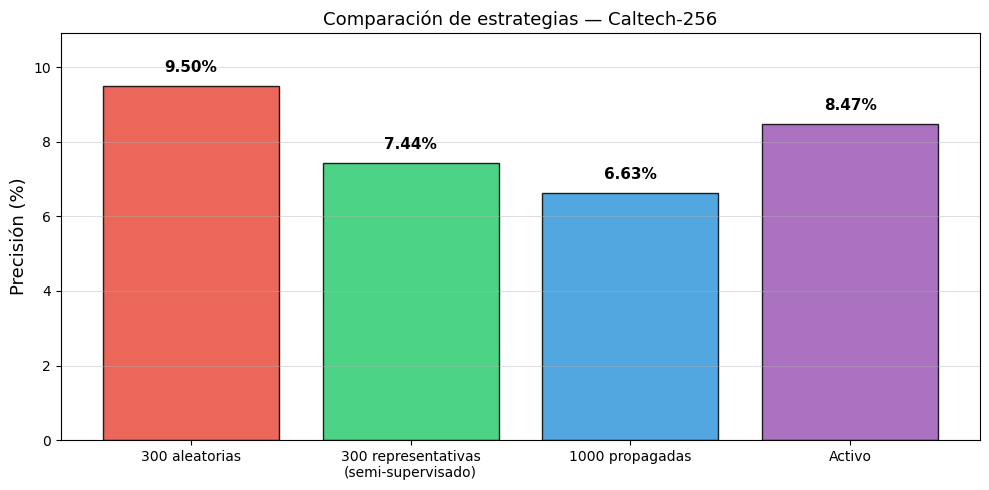

In [47]:
print("=" * 60)
print("  RESUMEN — PUNTO 2  |  Caltech-256")
print("=" * 60)
print(f"  Imágenes totales (m)  : {X_data.shape[0]}")
print(f"  Características raw   : {X_data.shape[1]}")
print(f"  Características PCA   : 100")
print(f"  Clases                : {len(np.unique(y_data))}")
print(f"  k (clusters KMeans)   : {k}")
print(f"  Silhouette Score      : {score_sil:.4f}")
print(f"  Varianza explicada PCA: {varianza_explicada:.2f}%")
print()
print(f"  [{score_random*100:.2f}%] {k} imágenes aleatorias")
print(f"  [{score2*100:.2f}%] {k} imágenes representativas (semi-supervisado)")
print(f"  [{score3*100:.2f}%] 1000 muestras propagadas")
print(f"  [{score5*100:.2f}%] aprendizaje activo")
print()
print(f"  Mejora semi-supervisado vs aleatorio: +{(score2-score_random)*100:.2f}%")
print(f"  Mejora activo vs propagado          : +{(score5-score3)*100:.2f}%")
print("=" * 60)

metodos = [
    f'{k} aleatorias',
    f'{k} representativas\n(semi-supervisado)',
    '1000 propagadas',
    'Activo'
]
scores  = [score_random, score2, score3, score5]
colores = ['#e74c3c', '#2ecc71', '#3498db', '#9b59b6']

plt.figure(figsize=(10, 5))
bars = plt.bar(metodos, [s*100 for s in scores],
               color=colores, edgecolor='black', alpha=0.85)
for bar, score in zip(bars, scores):
    plt.text(bar.get_x() + bar.get_width()/2,
             bar.get_height() + 0.3,
             f'{score*100:.2f}%',
             ha='center', va='bottom', fontsize=11, fontweight='bold')
plt.ylabel("Precisión (%)", fontsize=13)
plt.title("Comparación de estrategias — Caltech-256", fontsize=13)
plt.ylim(0, max([s*100 for s in scores]) * 1.15)
plt.grid(axis='y', alpha=0.4)
plt.tight_layout()
plt.show()